# Plotly

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [3]:
# remove warnings
import warnings
warnings.filterwarnings('ignore')


In [4]:
df = pd.read_csv("diamonds.csv")
print(df.shape)
df = df.sample(frac = 0.1, random_state = 10) #10 percent of data
print(df.shape)

(53940, 11)
(5394, 11)


In [5]:
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
8018,8019,1.01,Premium,E,SI1,61.7,56.0,4330,6.44,6.39,3.96
1583,1584,0.70,Very Good,D,VS1,60.4,58.0,3008,5.71,5.78,3.47
9138,9139,1.13,Very Good,H,SI2,59.8,59.0,4537,6.75,6.82,4.06
2787,2788,0.76,Ideal,F,VS2,61.0,55.0,3257,5.89,5.92,3.60
52429,52430,0.70,Premium,I,VVS1,61.2,59.0,2513,5.65,5.69,3.47


In [6]:
df.reset_index(drop=True , inplace = True)

In [7]:
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,8019,1.01,Premium,E,SI1,61.7,56.0,4330,6.44,6.39,3.96
1,1584,0.70,Very Good,D,VS1,60.4,58.0,3008,5.71,5.78,3.47
2,9139,1.13,Very Good,H,SI2,59.8,59.0,4537,6.75,6.82,4.06
3,2788,0.76,Ideal,F,VS2,61.0,55.0,3257,5.89,5.92,3.60
4,52430,0.70,Premium,I,VVS1,61.2,59.0,2513,5.65,5.69,3.47


# Scatter Plot

In [9]:

fig = px.scatter(df , x = "carat" , y="price")
fig.show()

In [10]:
# scatter Plot
fig = px.scatter(df , x = "carat" , y="price" , color = "cut")
fig.show()

In [11]:
# scatter Plot
fig = px.scatter(df , x = "carat" , y="price" , color = "cut", 
                title = "Diamond price vs carat weight")
fig.show()

# Line Plot

In [13]:
fig = px.line(df , x = "carat" , y="price")
fig.show()

In [14]:
# Plot a Line PLot (e.g mean price by carat)

df_mean = df.groupby("carat")["price"].mean().reset_index()
df_mean.head()

,carat,price
0,0.21,386.000000
1,0.23,466.156250
2,0.24,499.121212
3,0.25,538.823529
4,0.26,543.785714


In [15]:
fig = px.line(df_mean , x="carat" , y="price" , title="Mean Price by carat")
fig.show()

# Bar PLot

In [17]:
fig = px.bar(df , x="cut" , y="price" , color = "cut", title = "Average Price")
fig.show()

In [18]:
df_stats = df.groupby("cut")["price"].agg(["mean" , "std"]).reset_index()
df_stats.head()

,cut,mean,std
0,Fair,4721.005952,3952.692720
1,Good,4011.286652,3775.099642
2,Ideal,3530.320639,3858.748131
3,Premium,4495.760194,4342.828339
4,Very Good,3987.675314,3929.767320


In [19]:
fig = px.bar(df_stats , x="cut" , y="mean" , color = "cut", title = "Average Price" , error_y="std")
fig.show()

# Histogram PLot

In [21]:
fig = px.histogram(df , x="price", nbins=40,
                  title="Price distribution")
fig.show()

In [22]:
fig = px.histogram(df , x="price", nbins=20, color = "cut",
                  title= "Price distribution")
fig.show()

# Box Plot

In [24]:
fig = px.box(df, x='color', y='price', title='Diamond Price Box Plot by Color')
fig.show()

In [25]:
fig = px.box(df, x='color', y='price',
             #Outliers
             points = "all",
             title='Diamond Price Box Plot by Color')
fig.show()

In [26]:
fig = px.box(df, x='color', y='price', color = "clarity",
             #Outliers
             points = "outliers",
             title='Price Distribution by cut')
fig.show()

# Density Contour 

In [28]:
fig = px.density_contour(df, x='color', y='price', title='Density Contour Plot')
fig.show()

# Facet Scatter

In [30]:
fig = px.scatter(df, x="carat", y="price",
                 color="cut",
                 facet_col="clarity",
                 title="Price vs Carat by Cut and Clarity")

fig.show()

In [31]:
fig = px.scatter(df, x="carat", y="price",
                 color="cut",
                 facet_col="clarity",
                 #animation by cut
                 animation_frame ="cut",
                 title="Price vs Carat by Cut and Clarity")

fig.show()

In [32]:
fig = px.scatter(df, x="carat", y="price",
                 color="cut",
                 facet_col="clarity",
                 size="price",
                 #animation by cut
                 animation_frame ="cut",
                 title="Price vs Carat by Cut and Clarity")

fig.show()

# Density Heatmap

In [34]:
# Create the density heatmap
fig = px.density_heatmap(
    df,
    x="carat",
    y="price",
    title="Density Heatmap "
)

# Display the plot
fig.show()

# Subplots

In [36]:
from plotly.subplots import make_subplots


# Create subplot layout: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=("Price vs Carat", "Price Distribution"))

# Scatter plot (Price vs Carat)
fig.add_trace(
    go.Scatter(x=df["carat"], y=df["price"], mode="markers", marker=dict(color="blue", size=3), name="Carat vs Price"),
    row=1, col=1
)

# Histogram (Price distribution)
fig.add_trace(
    go.Histogram(x=df["price"], nbinsx=50, name="Price Histogram", marker_color="green"),
    row=1, col=2
)

# Update layout
fig.update_layout(title_text="Diamonds Dataset Subplots", showlegend=False)
fig.show()


In [37]:
fig = px.scatter(
    df, x="carat", y="price", color="cut",
    facet_col="cut",  # creates a subplot for each cut
    facet_col_wrap=3,  # wraps into multiple rows
    opacity=0.5
)

fig.update_layout(title_text="Price vs Carat Faceted by Cut")
fig.show()


# 3D PLOTS

In [39]:
# Create 3D scatter plot
fig = px.scatter_3d(
    df,
    x="carat",          # X-axis
    y="depth",          # Y-axis
    z="price",          # Z-axis
    color="cut",        # Color by cut quality
    size="table",       # Size by table percentage
    opacity=0.6,
    title="3D Scatter Plot of Diamonds Dataset"
)

fig.show()

# Bubble Chart

In [41]:
fig = px.scatter(
    df,
    x="carat",       # X-axis = carat
    y="price",       # Y-axis = price
    color="clarity", # color by clarity
    size="table",    # marker size by table percentage
    opacity=0.6,
    title="3D Scatter Plot: Carat vs Price vs Depth"
)

fig.show()

# Area PLot

In [43]:
# Area plot
df_sorted = df.sort_values(by="carat")

fig = px.area(
    df_sorted,
    x="carat",
    y="price",
    title="Comulative price by carat Price by Carat (Area Plot)"
)
fig.show()

In [44]:
# Area plot
df_sorted = df.sort_values(by="carat")

fig = px.area(
    df_sorted,
    x="carat",
    y="price",
    color="cut",
    title="Comulative price by carat Price by Carat (Area Plot)"
)
fig.show()

# Pie chart

In [46]:
fig = px.pie(df, names="clarity", title = "Diamond cut")
fig.show()

In [47]:
fig = px.pie(
    df,
    names="clarity",
    title="Diamond Clarity Distribution",
    color_discrete_sequence=px.colors.qualitative.Set2  # nice categorical colors
)
fig.show()

# Tree Plot

In [49]:
fig = px.treemap(
    df,
    path=["cut"],   # hierarchy: cut at top
    values="price",            # size boxes by price
    color="cut",               # color by cut
    title="Treemap of Diamonds (Cut → Clarity by Price)"
)
fig.show()

In [50]:
fig = px.treemap(
    df,
    path=["cut", "clarity"],   # hierarchy: cut at top, clarity inside
    values="price",            # size boxes by price
    color="cut",               # color by cut
    title="Treemap of Diamonds (Cut → Clarity by Price)"
)
fig.show()

In [51]:
fig = px.treemap(
    df,
    path=["cut", "clarity", "color"],   # hierarchy: cut at top, clarity inside and also color
    values="price",            # size boxes by price
    color="cut",               # color by cut
    title="Treemap of Diamonds (Cut → Clarity by Price)"
)
fig.show()

# Parallel Cordinates

In [53]:
fig = px.parallel_coordinates(
    df,
    dimensions=["carat", "depth", "table", "price"],  # numeric columns
    color="price",  # continuous color scale
    #color_continuous_scale=px.colors.sequential.Viridis,
    title="Parallel Coordinates Plot of Diamonds"
)
fig.show()

In [54]:
fig = px.parallel_categories(
    df,
    dimensions=["cut", "clarity", "color"],
    color=df["price"],
    color_continuous_scale=px.colors.sequential.Inferno,
    title="Parallel Categories Plot of Diamonds"
)
fig.show()

# Scatter Matrix

In [56]:
fig = px.scatter_matrix(
    df,
    dimensions=["carat", "depth", "table", "price"],  # numeric features
    color="cut",   # color points by cut
    title="Scatter Matrix of Diamonds"
)

fig.show()

# Strip Plot

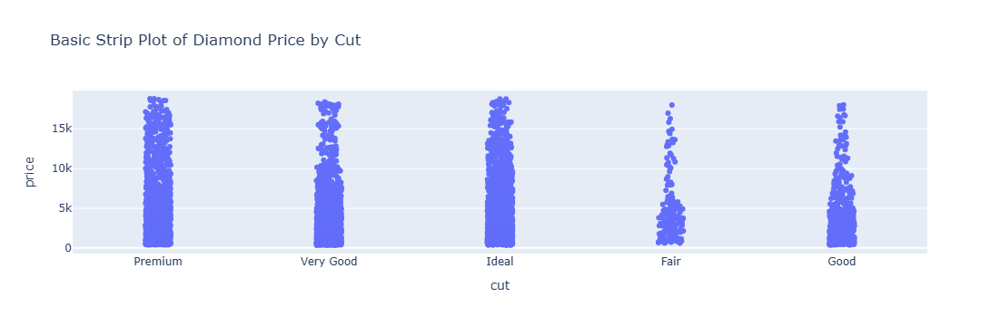

In [58]:
fig = px.strip(
    df,
    x="cut",         # category on X-axis
    y="price",       # numeric values on Y-axis
    title="Basic Strip Plot of Diamond Price by Cut"
)
fig.show()

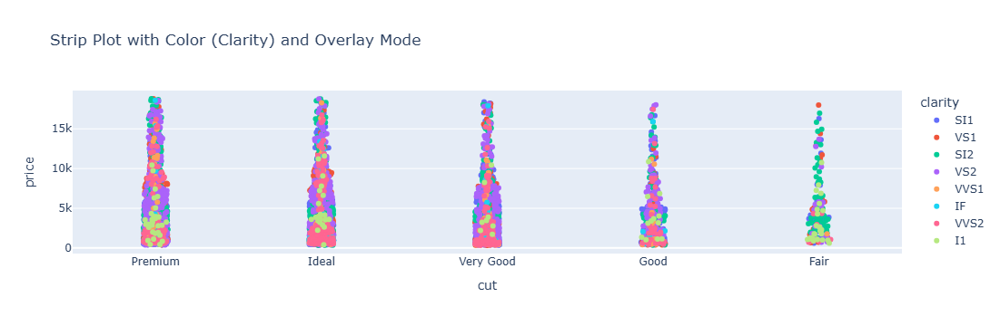

In [59]:
fig = px.strip(
    df,
    x="cut",
    y="price",
    color="clarity",      # color dots by clarity
    stripmode="overlay",  # overlay dots instead of spreading
    title="Strip Plot with Color (Clarity) and Overlay Mode"
)
fig.show()

# Sunburst

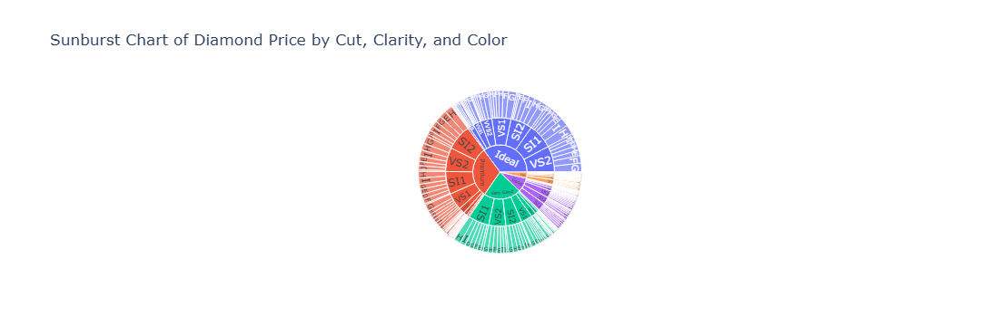

In [61]:
fig1 = px.sunburst(
    df,
    path=['cut', 'clarity', 'color'],
    values='price',
    title='Sunburst Chart of Diamond Price by Cut, Clarity, and Color'
)
fig1.show()

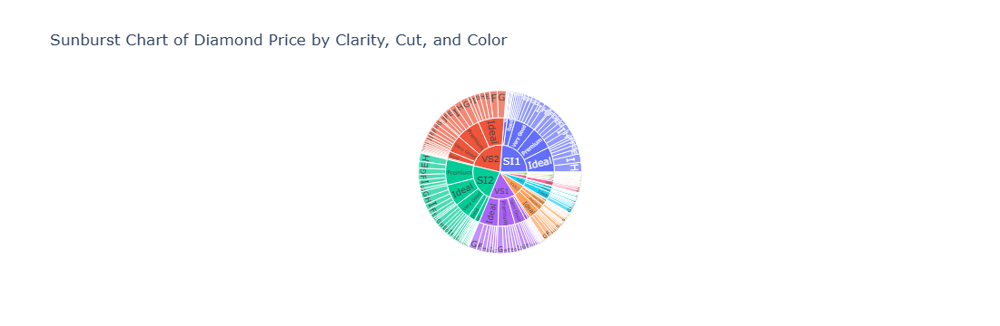

In [62]:
fig2 = px.sunburst(
    df,
    path=['clarity', 'cut', 'color'],
    values='price',
    title='Sunburst Chart of Diamond Price by Clarity, Cut, and Color'
)
fig2.show()

# Donut Chart

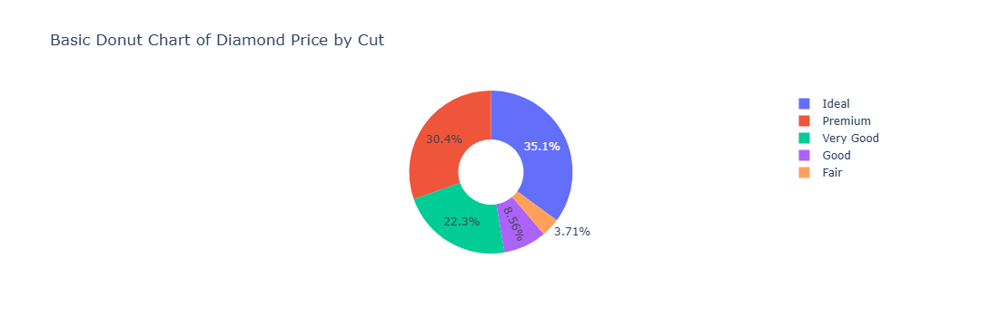

In [108]:
fig = px.pie(
    df,
    names="cut",      # categories
    values="price",   # numeric values
    hole=0.4,         # hole makes it a donut
    title="Basic Donut Chart of Diamond Price by Cut"
)
fig.show()

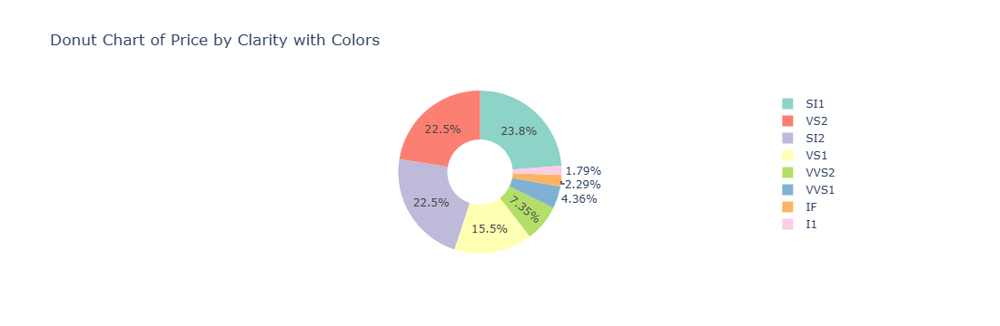

In [110]:
fig = px.pie(
    df,
    names="clarity",
    values="price",
    hole=0.4,
    color="clarity",
    color_discrete_sequence=px.colors.qualitative.Set3,
    title="Donut Chart of Price by Clarity with Colors"
)
fig.show()

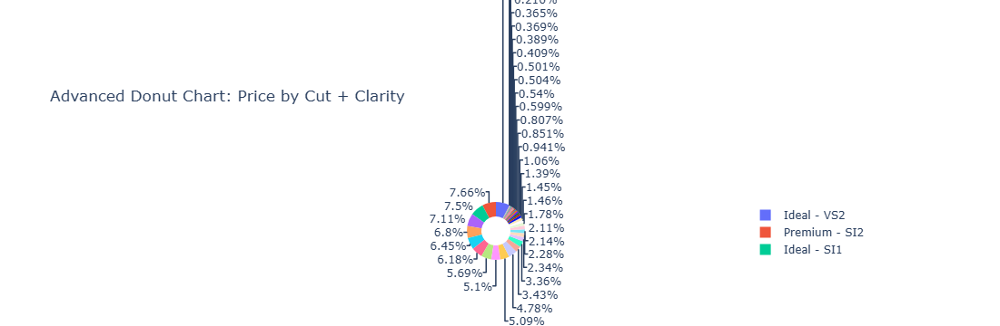

In [112]:
df["cut_clarity"] = df["cut"] + " - " + df["clarity"]

fig = px.pie(
    df,
    names="cut_clarity",
    values="price",
    hole=0.5,
    title="Advanced Donut Chart: Price by Cut + Clarity"
)
fig.show()


# Funnel Chart

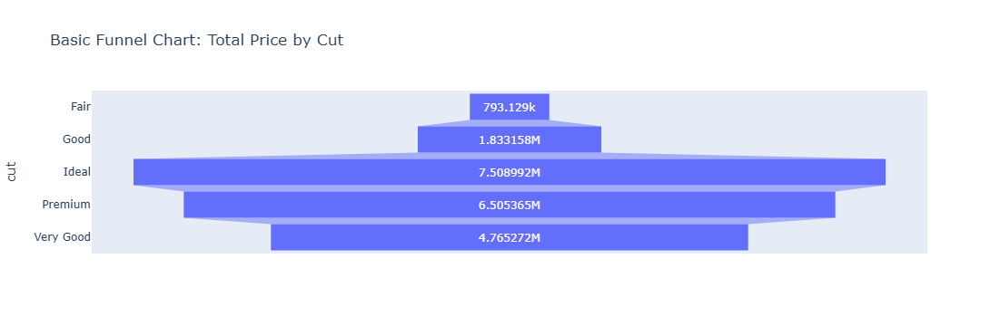

In [118]:
fig = px.funnel(
    df.groupby("cut").sum().reset_index(),
    x="price",
    y="cut",
    title="Basic Funnel Chart: Total Price by Cut"
)
fig.show()


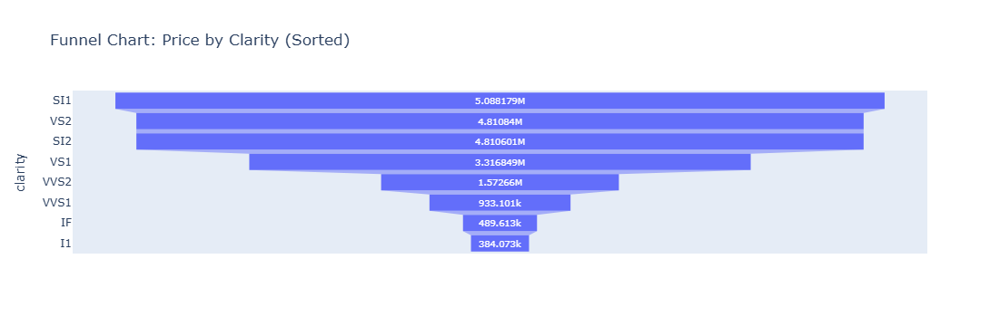

In [120]:
funnel_data = df.groupby("clarity").sum().reset_index().sort_values("price", ascending=False)

fig = px.funnel(
    funnel_data,
    x="price",
    y="clarity",
    title="Funnel Chart: Price by Clarity (Sorted)"
)
fig.show()


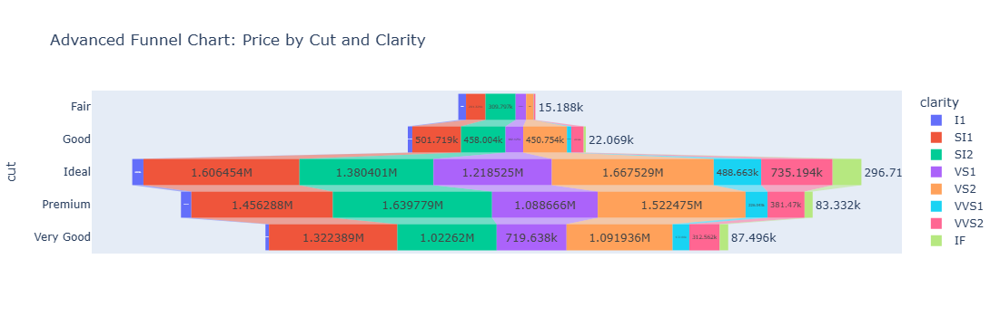

In [122]:
funnel_data = df.groupby(["cut", "clarity"]).sum().reset_index()

fig = px.funnel(
    funnel_data,
    x="price",
    y="cut",
    color="clarity",
    title="Advanced Funnel Chart: Price by Cut and Clarity"
)
fig.show()


# Water Fall Chart

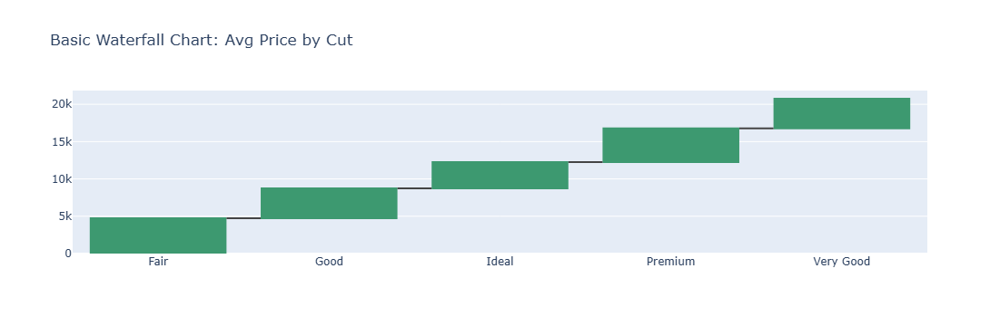

In [125]:
# Example: Avg price by cut
cut_data = df.groupby("cut")["price"].mean().reset_index()

fig = go.Figure(go.Waterfall(
    name="Price",
    orientation="v",
    x=cut_data["cut"],
    y=cut_data["price"]
))

fig.update_layout(title="Basic Waterfall Chart: Avg Price by Cut")
fig.show()


# Heatmap

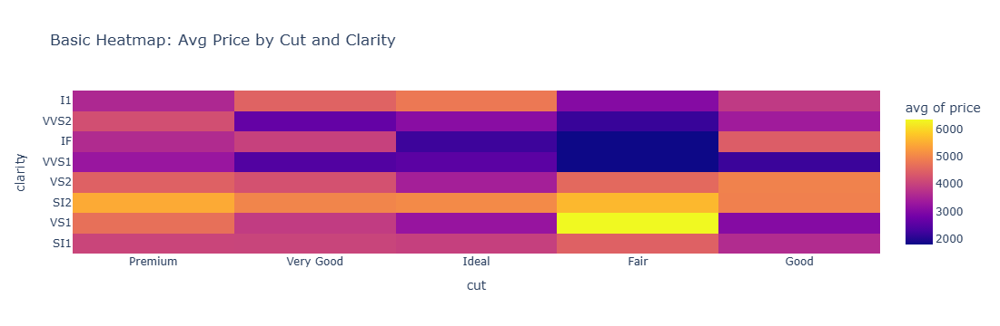

In [132]:
fig = px.density_heatmap(
    df,
    x="cut",
    y="clarity",
    z="price",
    histfunc="avg",    # show average price
    title="Basic Heatmap: Avg Price by Cut and Clarity"
)
fig.show()

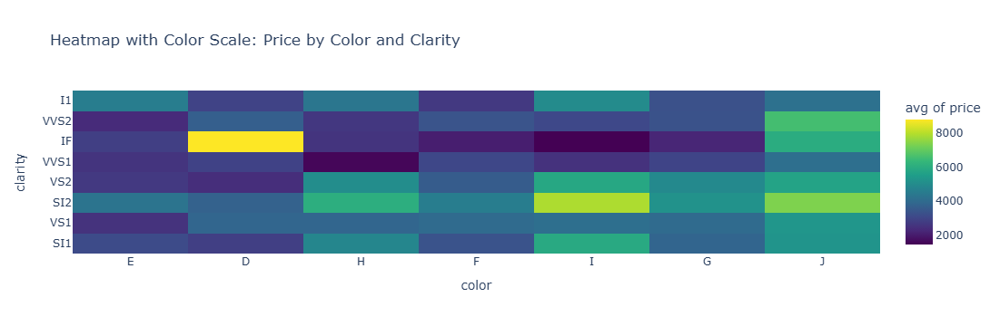

In [134]:
fig = px.density_heatmap(
    df,
    x="color",
    y="clarity",
    z="price",
    histfunc="avg",
    color_continuous_scale="Viridis",
    title="Heatmap with Color Scale: Price by Color and Clarity"
)
fig.show()


# Bubble Chart

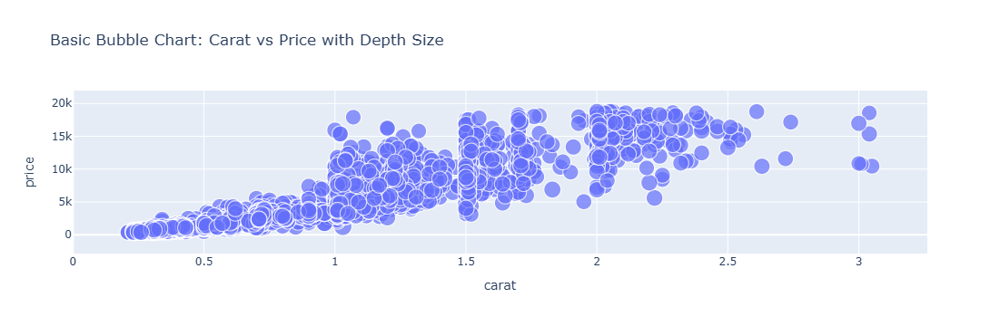

In [137]:
fig = px.scatter(
    df,
    x="carat",
    y="price",
    size="depth",       # bubble size
    title="Basic Bubble Chart: Carat vs Price with Depth Size"
)
fig.show()

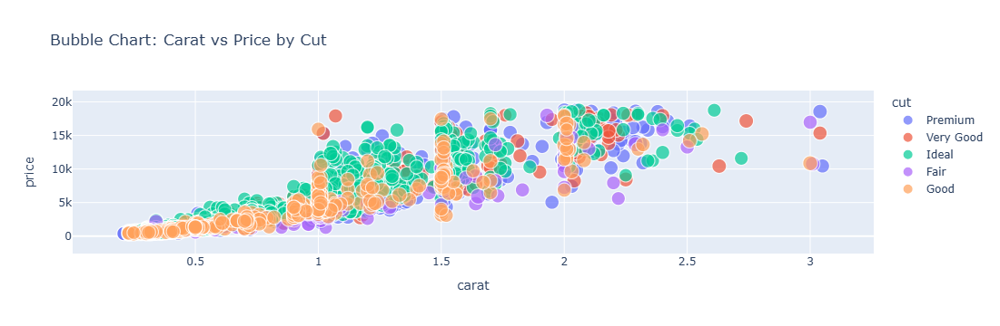

In [139]:
fig = px.scatter(
    df,
    x="carat",
    y="price",
    size="table",
    color="cut",        # color by cut
    hover_name="clarity",
    title="Bubble Chart: Carat vs Price by Cut"
)
fig.show()


# 3D Surface PLot

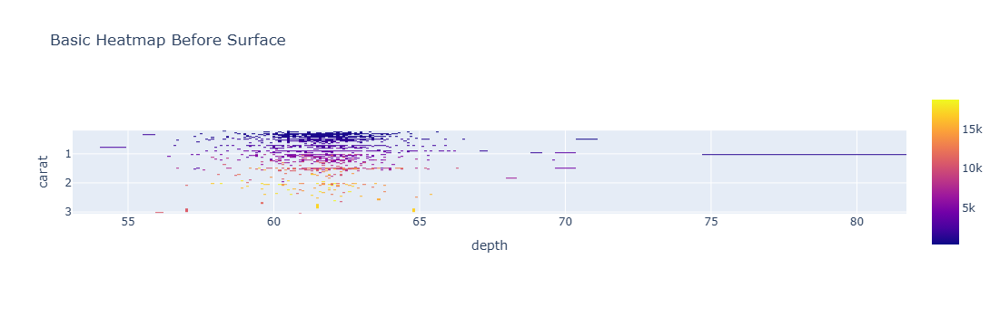

In [142]:
# Create pivot table for surface
pivot = df.pivot_table(values="price", index="carat", columns="depth", aggfunc="mean")

fig = px.imshow(pivot, title="Basic Heatmap Before Surface")
fig.show()

# Timeline Chart

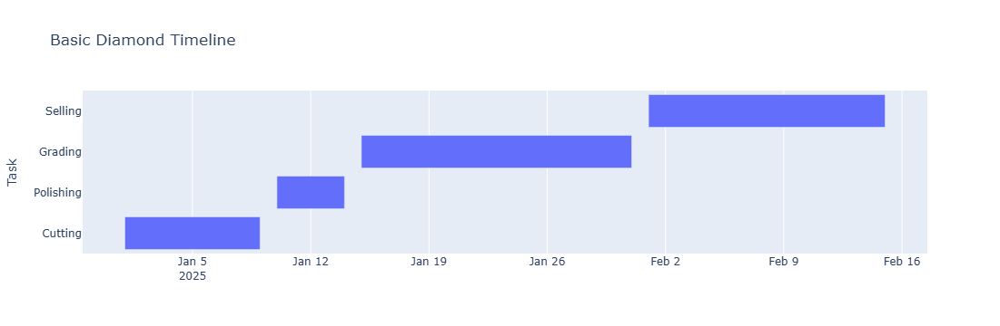

In [145]:
import pandas as pd

timeline_data = pd.DataFrame({
    "Task": ["Cutting", "Polishing", "Grading", "Selling"],
    "Start": ["2025-01-01", "2025-01-10", "2025-01-15", "2025-02-01"],
    "Finish": ["2025-01-09", "2025-01-14", "2025-01-31", "2025-02-15"]
})

fig = px.timeline(
    timeline_data,
    x_start="Start",
    x_end="Finish",
    y="Task",
    title="Basic Diamond Timeline"
)
fig.show()
